In [1]:
# https://www.kaggle.com/c/landmark-recognition-2021/data?select=train.csv

In [2]:
import pandas as pd
import numpy as np
import os
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import layers
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras import regularizers
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from google.colab.patches import cv2_imshow
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix
import sys
import gc
import time
seed = 3

2025-08-03 11:08:01.255072: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1754219281.461207      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754219281.517026      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
from sklearn.utils import class_weight

In [4]:
def load_data() :
  train_df = pd.read_csv('/kaggle/input/landmark-recognition-2021/train.csv')
  train_df['img_path'] = train_df['id'].map(lambda r : os.path.join('/kaggle/input/landmark-recognition-2021/train', r[0], r[1], r[2], r + '.jpg'))
  train_df['landmark_id'] = train_df['landmark_id'].apply(lambda x : np.int32(x))
  return train_df

def read_resize(img) :
  arr = cv2.imread(img)
  image = cv2.resize(arr, (IMG_SIZE, IMG_SIZE))
  return image

def get_size(obj, seen = None) :
  """ Recursively finds size of objects """
  size = sys.getsizeof(obj)
  if seen is None:
    seen = set()

  obj_id = id(obj)
  if obj_id in seen :
    return 0
  seen.add(obj_id)
  if isinstance(obj, dict) :
    size += sum([get_size(v, seen) for v in obj.values()])
    size += sum([get_size(k, seen) for k in obj.keys()])
  elif hasattr(obj, '__dict__') :
    size += get_size(obj.__dict__, seen)
  elif hasattr(obj, '__iter__') and not isinstance(obj, (str, bytes, bytearray)) :
    size += sum([get_size(i, seen) for i in obj])
  return size

In [5]:
traindf = load_data()
print(traindf['landmark_id'].nunique())
traindf.head()

81313


,id,landmark_id,img_path
0,17660ef415d37059,1,/kaggle/input/landmark-recognition-2021/train/...
1,92b6290d571448f6,1,/kaggle/input/landmark-recognition-2021/train/...
2,cd41bf948edc0340,1,/kaggle/input/landmark-recognition-2021/train/...
3,fb09f1e98c6d2f70,1,/kaggle/input/landmark-recognition-2021/train/...
4,25c9dfc7ea69838d,7,/kaggle/input/landmark-recognition-2021/train/...


In [6]:
get_size(traindf)

652687222

In [7]:
# no. of images
traindf.shape[0]

1580470

In [8]:
traindf['landmark_id'].value_counts()

landmark_id
138982    6272
126637    2231
20409     1758
83144     1741
113209    1135
          ... 
27978        2
191093       2
191106       2
28330        2
28332        2
Name: count, Length: 81313, dtype: int64

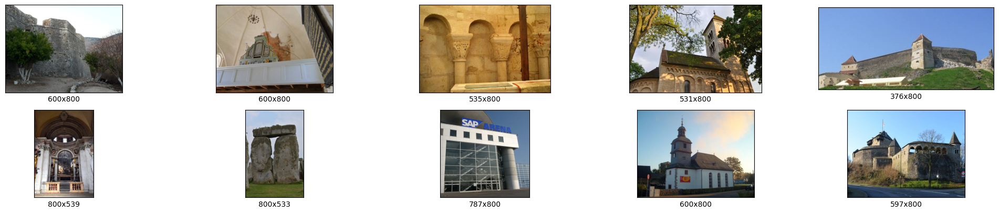

In [9]:
plt.figure(figsize= (25,10))
for i in range(10) :
  num = np.random.randint(traindf.shape[0])
  plt.subplot(4,5,i+1)
  im = plt.imread(traindf['img_path'][num])
  plt.xticks([])
  plt.yticks([])
  plt.xlabel(str(im.shape[0]) + 'x' + str(im.shape[1]))
  plt.imshow(im)
plt.show()

In [10]:
IMG_SIZE = 128
min_class = 0
max_class = 500
traindf = traindf[(traindf['landmark_id'] > min_class) & (traindf['landmark_id'] < max_class)]
undersampling_threshold = 80
traindf = traindf.groupby('landmark_id', group_keys=False).apply(lambda x : x.sample(n = min(undersampling_threshold, len(x)), random_state = seed))
traindf.reset_index(drop=True, inplace=True)
n_classes = traindf['landmark_id'].unique()
print(f"No. of classes : {traindf['landmark_id'].nunique()}")
print(traindf['landmark_id'].value_counts())

No. of classes : 186
landmark_id
27     80
192    80
389    80
341    80
145    80
       ..
289     2
191     2
177     2
461     2
499     2
Name: count, Length: 186, dtype: int64


/tmp/ipykernel_36/2062598045.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  traindf = traindf.groupby('landmark_id', group_keys=False).apply(lambda x : x.sample(n = min(undersampling_threshold, len(x)), random_state = seed))


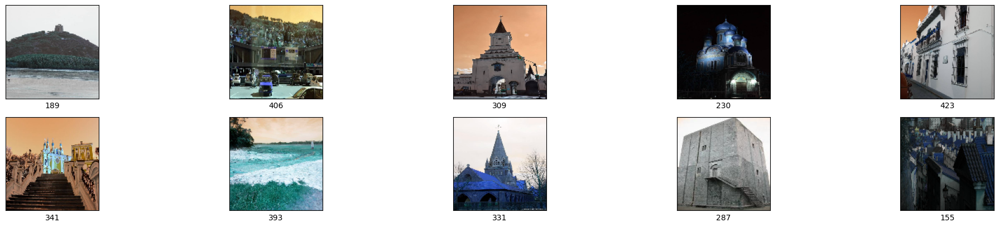

In [11]:
plt.figure(figsize= (25,10))
for i in range(10) :
  num = np.random.randint(traindf.shape[0])
  plt.subplot(4,5,i+1)
  im = read_resize(traindf['img_path'][num])
  plt.xticks([])
  plt.yticks([])
  plt.xlabel(traindf['landmark_id'][num])
  plt.imshow(im)
plt.show()

In [13]:
X = [] # images
y = [] # labels
for i in range(traindf.shape[0]) :
  img = read_resize(traindf['img_path'][i])
  X.append(img)
  y.append(traindf['landmark_id'][i])

In [14]:
classes = traindf['landmark_id'].unique()
le = LabelEncoder()
le.fit(classes)
y_le = le.transform(y)

In [15]:
n_c = len(le.classes_)
n_c

186

In [16]:
X = [n/255 for n in X]
X= np.array(X)
y = np.array(y)
y_le = np.array(y_le)

In [17]:
xtrain, xval, ytrain, yval = train_test_split(X, y_le, test_size = 0.1, random_state = seed, shuffle = True)
xtrain, xtest, ytrain, ytest = train_test_split(xtrain, ytrain, test_size = 0.01, random_state = seed, shuffle = True)
len(xtrain), len(xtest), len(xval), len(ytrain)

(2867, 29, 322, 2867)

I0000 00:00:1754219388.534069      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1754219388.534732      36 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5
/tmp/ipykernel_36/1508887813.py:18: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, 5, i+1)


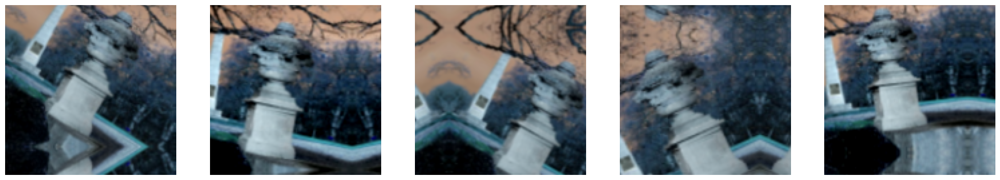

In [18]:
data_augmentation = tf.keras.Sequential([
   # layers.RandomFlip('horizontal'),
   # layers.RandomCrop(120, 120, seed = seed),
    layers.RandomRotation(factor = (-0.1, 0.1)),
    layers.RandomZoom(height_factor = (-0.2, 0.2)),
    layers.RandomTranslation(height_factor = (-0.2, 0.2), width_factor = (-0.2, 0.2)),
    layers.RandomContrast(0.4)
])

plt.figure(figsize = (25, 7))
img = X[1]
plt.imshow(img)
plt.axis('off')
plt.xlabel("Original Image")

for i in range(5) :
  mod = data_augmentation(img)
  plt.subplot(1, 5, i+1)
  plt.imshow(mod)
  plt.axis('off')
  plt.xlabel("Augmented Image")
plt.show()

In [19]:
oversampling_threshold = 15
for i in range(n_c):
    # Count samples for class i
    class_mask = (ytrain == i)  # Remove int() conversion
    count = np.sum(class_mask)

    if count < oversampling_threshold:
        # Get all images of class i
        class_images = xtrain[class_mask]
        
        # Skip if no samples found (safety check)
        if len(class_images) == 0:
            print(f"Warning: Class {i} has 0 samples. Skipping.")
            continue
            
        # Randomly sample to reach threshold
        num_to_add = oversampling_threshold - count
        random_indices = np.random.choice(len(class_images), size=num_to_add)  # Safer than randint
        new_images = class_images[random_indices]

        # Append new samples
        xtrain = np.concatenate((xtrain, new_images), axis=0)
        ytrain = np.append(ytrain, [i] * num_to_add)

print(f"Final dataset size: {len(xtrain)}")

Final dataset size: 3983


In [20]:
# CNN Hyperparameters
kernelsize = (3,3)
stridesize = (2,2)
activation = 'relu'
poolsize = (2,2)
padding = 'same'
regularizer = regularizers.l2(0.01)
epochs = 1000
batchsize = 256
lr = 0.01

In [21]:
def create_model() :
  model = keras.Sequential([
      # Data Augmentation
      layers.RandomRotation(factor = (-0.1, 0.1)),
      layers.RandomZoom(height_factor = (-0.2, 0.2)),
      layers.RandomTranslation(height_factor = (-0.2, 0.2), width_factor = (-0.2, 0.2)),
      layers.RandomContrast(0.4),

      # Feature Extraction
      layers.Conv2D(32, kernel_size = kernelsize, activation = activation, padding = padding, strides = 1, input_shape = [IMG_SIZE, IMG_SIZE, 3]),
      layers.BatchNormalization(),
      layers.MaxPooling2D(pool_size = poolsize, strides = stridesize, padding = padding),

      layers.Conv2D(64, kernel_size = kernelsize, activation = activation, padding = padding, strides = 1),
      layers.BatchNormalization(),
      layers.MaxPooling2D(pool_size = poolsize, strides = stridesize, padding = padding),

      layers.Conv2D(128, kernel_size = kernelsize, activation = activation, padding = padding, strides = 1),
      layers.BatchNormalization(),
      layers.MaxPooling2D(pool_size = poolsize, strides = stridesize, padding = padding),

      layers.Conv2D(256, kernel_size = kernelsize, activation = activation, padding = padding, strides = 1),
      layers.BatchNormalization(),
      layers.MaxPooling2D(pool_size = poolsize, strides = stridesize, padding = padding),

      layers.Conv2D(512, kernel_size = kernelsize, activation = activation, padding = padding, strides = 1),
      layers.BatchNormalization(),
      layers.MaxPooling2D(pool_size = poolsize, strides = stridesize, padding = padding),

      # model head
      layers.Flatten(),
      layers.Dense(512, activation = activation, kernel_regularizer = regularizer),
      layers.BatchNormalization(),

      layers.Dense(n_c, activation = 'softmax')
  ])

  # Optimizers
  opt1 = keras.optimizers.Adam(learning_rate = lr, beta_1 = 0.9, beta_2 = 0.999, epsilon=1e-7)
  opt2 = keras.optimizers.RMSprop(learning_rate = lr, rho = 0.9, momentum = 0.5, epsilon=1e-7)
  opt3 = keras.optimizers.SGD(learning_rate=lr, momentum=0.9, nesterov=True)

  model.compile(optimizer = opt3, loss = 'sparse_categorical_crossentropy', metrics = ['sparse_categorical_accuracy'])

  # callbacks
  es = EarlyStopping(monitor = 'val_loss', patience=150, min_delta = 0.0001, mode = 'auto', restore_best_weights=True)
  reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', factor = 0.3, patience = 40, min_delta = 0.001, cooldown = 1, min_lr = 0.005, verbose = 1)
  mc = ModelCheckpoint('best.weights.h5', save_best_only=True, save_weights_only=True, monitor = 'val_loss')

  # training model
  history = model.fit(
      xtrain, ytrain,
      validation_data = (xval, yval),
      epochs = epochs,
      batch_size = batchsize,
      steps_per_epoch = len(xtrain) // batchsize,
      callbacks = [es, reduce_lr, mc],
      verbose = 1,
      shuffle = True,
      class_weight = train_classWeights,
      # use_multiprocessing = True,
      # workers = 32,
      # max_queue_size = 15  # default : 10
  )
  return model, history

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/1000


I0000 00:00:1754219458.949968     120 cuda_dnn.cc:529] Loaded cuDNN version 90300


15/15 ━━━━━━━━━━━━━━━━━━━━ 17s 420ms/step - loss: 15.0824 - sparse_categorical_accuracy: 0.0254 - val_loss: 14.6854 - val_sparse_categorical_accuracy: 0.0000e+00 - learning_rate: 0.0100
Epoch 2/1000
15/15 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 14.3540 - sparse_categorical_accuracy: 0.0769 - val_loss: 14.6872 - val_sparse_categorical_accuracy: 0.0000e+00 - learning_rate: 0.0100
Epoch 3/1000


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 349ms/step - loss: 13.1064 - sparse_categorical_accuracy: 0.1633 - val_loss: 14.3395 - val_sparse_categorical_accuracy: 0.0124 - learning_rate: 0.0100
Epoch 4/1000
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 11.9706 - sparse_categorical_accuracy: 0.2587 - val_loss: 14.2866 - val_sparse_categorical_accuracy: 0.0155 - learning_rate: 0.0100
Epoch 5/1000
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 350ms/step - loss: 11.8401 - sparse_categorical_accuracy: 0.2790 - val_loss: 13.6290 - val_sparse_categorical_accuracy: 0.0124 - learning_rate: 0.0100
Epoch 6/1000
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 26ms/step - loss: 11.2209 - sparse_categorical_accuracy: 0.3357 - val_loss: 13.5948 - val_sparse_categorical_accuracy: 0.0124 - learning_rate: 0.0100
Epoch 7/1000
15/15 ━━━━━━━━━━━━━━━━━━━━ 5s 351ms/step - loss: 10.7407 - sparse_categorical_accuracy: 0.3789 - val_loss: 13.2677 - val_sparse_categorical_accuracy: 0.0186 - learning_rate: 0.0100
Epoch 8/1000
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 26

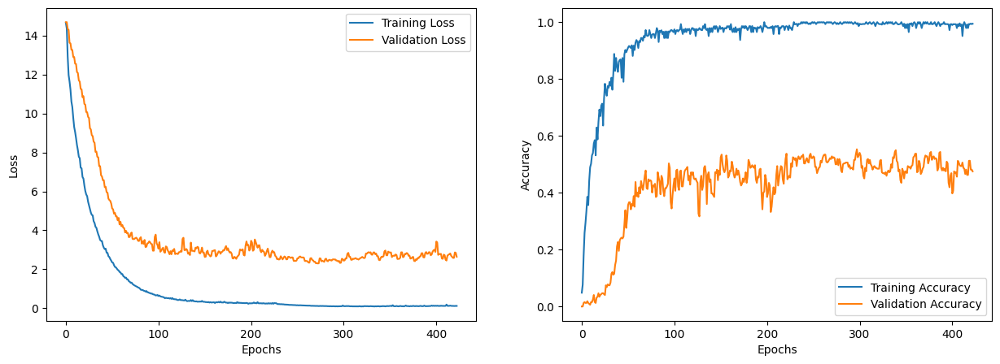

In [22]:
classwts = class_weight.compute_class_weight(class_weight = 'balanced', classes = np.unique(ytrain), y = ytrain)
train_classWeights = dict(enumerate(classwts))

model, history = create_model()
plt.figure(figsize = (15, 5))
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label = 'Training Loss')
plt.plot(history.history['val_loss'], label = 'Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['sparse_categorical_accuracy'], label = 'Training Accuracy')
plt.plot(history.history['val_sparse_categorical_accuracy'], label = 'Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [23]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ random_rotation_1               │ (None, 128, 128, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom_1 (RandomZoom)      │ (None, 128, 128, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_translation_1            │ (None, 128, 128, 3)    │             0 │
│ (RandomTranslation)             │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_contrast_1               │ (None, 128, 128, 3)    │             0 │
│ (RandomContrast)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 128, 128, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 16, 16, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 8, 8, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 8, 8, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │     4,194,81

 Total params: 11,726,646 (44.73 MB)

 Trainable params: 5,861,818 (22.36 MB)

 Non-trainable params: 3,008 (11.75 KB)

 Optimizer params: 5,861,820 (22.36 MB)

In [24]:
score = model.evaluate(xtest, ytest)
print(f"Test Loss : {score[0]}")
print(f"Test Accuracy : {score[1]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step - loss: 2.2853 - sparse_categorical_accuracy: 0.5862
Test Loss : 2.285276174545288
Test Accuracy : 0.5862069129943848


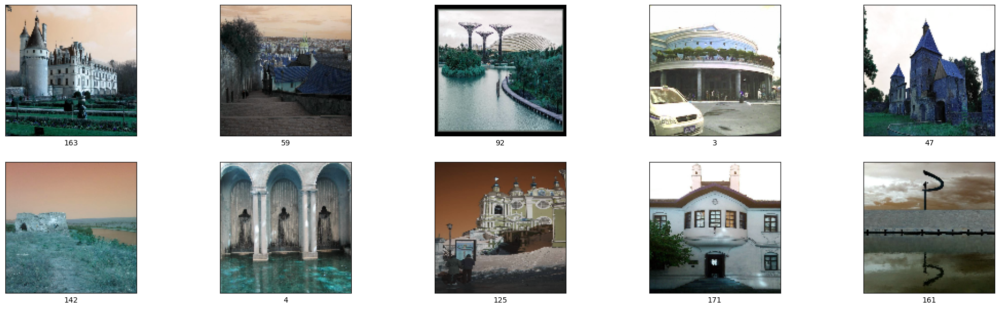

In [25]:
plt.figure(figsize = (25, 7))
for i in range(10) :
  plt.subplot(2,5,i+1)
  plt.imshow(xtest[i])
  plt.xlabel(ytest[i])
  plt.yticks([])
  plt.xticks([])
plt.show()

In [26]:
ypred = model.predict(xtest, verbose = 1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step


In [27]:
y_pred = []
confidence = []
for i in range(len(ypred)) :
  y_pred.append(np.argmax(ypred[i]))
  confidence.append((np.max(ypred[i])).round(2))
y_pred = le.inverse_transform(y_pred)
ytest = le.inverse_transform(ytest)

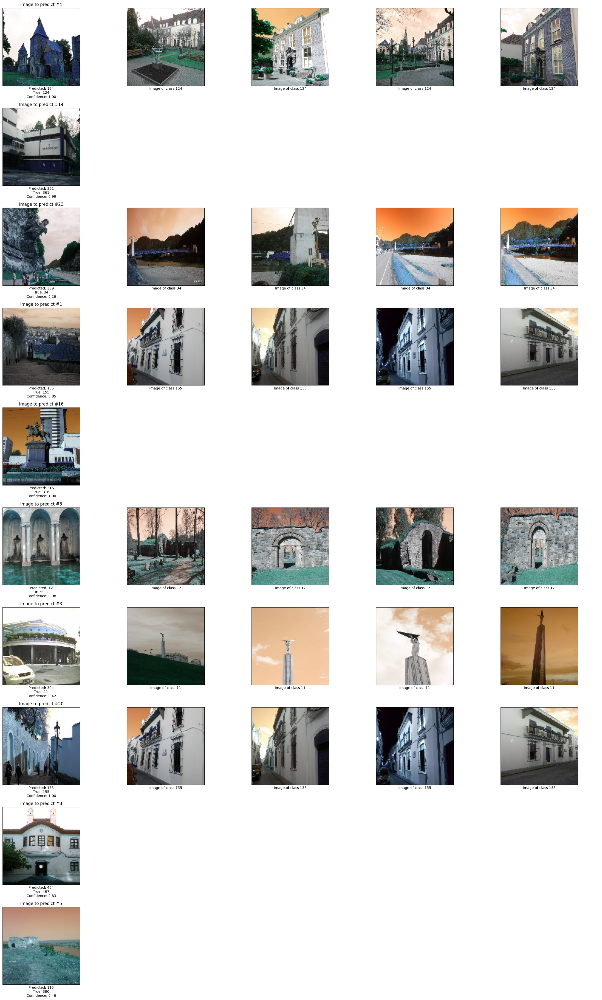

In [36]:
# display results
random_test_img_idx = np.random.choice(len(xtest), 10, replace=False)  # Get 10 unique random indices
fig, ax = plt.subplots(10, 5, figsize=(25, 40))  # 10 rows (test images), 5 columns (test + 4 examples)

for row, img_idx in enumerate(random_test_img_idx):
    predicted = y_pred[img_idx]
    true = ytest[img_idx]
    confidence = ypred[img_idx].max() if hasattr(ypred[img_idx], 'max') else ypred[img_idx]  # Handle confidence
    
    # Display test image to predict (first column)
    ax[row, 0].imshow(xtest[img_idx])
    ax[row, 0].set_xticks([])
    ax[row, 0].set_yticks([])
    ax[row, 0].set_title(f"Image to predict #{img_idx}")
    ax[row, 0].set_xlabel(f"Predicted: {predicted}\nTrue: {true}\nConfidence: {confidence:.2f}")
    
    # Display 4 training examples of the true class (columns 2-5)
    class_examples = xtrain[ytrain == true][:4]
    for col in range(1, 5):
        if col-1 < len(class_examples):  # Check if example exists
            ax[row, col].imshow(class_examples[col-1])
            ax[row, col].set_xticks([])
            ax[row, col].set_yticks([])
            ax[row, col].set_xlabel(f"Image of class {true}")
        else:
            ax[row, col].axis('off')  # Hide if no example available

plt.tight_layout()
plt.show()

<font size = 4>__label 12 images__

Total images: 25


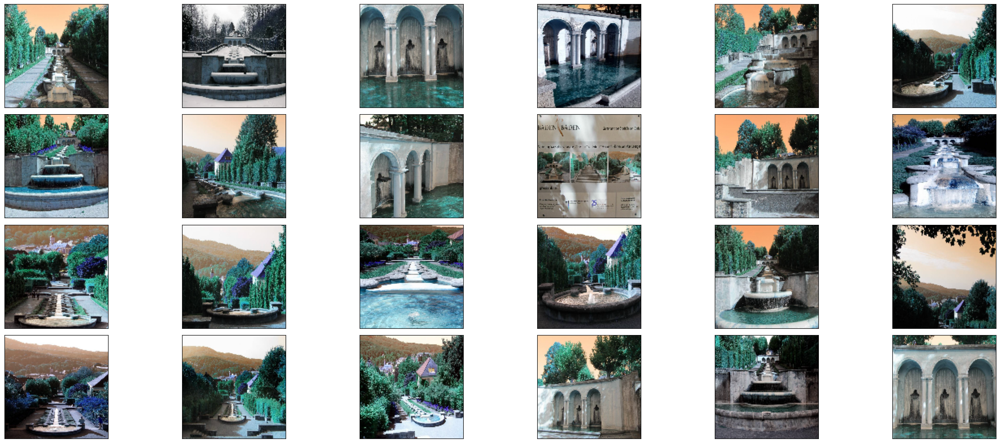

In [63]:
p = traindf[traindf['landmark_id'] == 12]['img_path']
p = list(p)

print(f"Total images: {len(p)}")

rows = 4
cols = 6
max_images = rows * cols  # 24

plt.figure(figsize=(25, 10))

for i in range(min(len(p), max_images)):
    plt.subplot(rows, cols, i+1)  # Positions 1-24
    img = read_resize(p[i])
    plt.xticks([])
    plt.yticks([])
    plt.imshow(img)

plt.tight_layout()
plt.show()